In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clona el repositorio con las imagenes y etiquetas
!git clone https://github.com/weecology/NeonTreeEvaluation.git # Clona el modelo
!pip install -U -r yolov5/requirements.txt  # instala las dependencias del modelo


Cloning into 'yolov5'...
remote: Enumerating objects: 11142, done.
remote: Total 11142 (delta 0), reused 0 (delta 0), pack-reused 11142
Receiving objects: 100% (11142/11142), 11.14 MiB | 25.01 MiB/s, done.
Resolving deltas: 100% (7699/7699), done.
Cloning into 'NeonTreeEvaluation'...
remote: Enumerating objects: 17048, done.
remote: Counting objects: 100% (193/193), done.
remote: Compressing objects: 100% (137/137), done.
remote: Total 17048 (delta 117), reused 114 (delta 56), pack-reused 16855
Receiving objects: 100% (17048/17048), 5.07 GiB | 26.49 MiB/s, done.
Resolving deltas: 100% (3201/3201), done.
Checking out files: 100% (9099/9099), done.
     |████████████████████████████████| 11.2 MB 5.3 MB/s 
     |████████████████████████████████| 60.4 MB 27 kB/s 
     |████████████████████████████████| 4.3 MB 34.7 MB/s 
     |████████████████████████████████| 596 kB 45.1 MB/s 
     |████████████████████████████████| 63 kB 1.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.4 MB/s 


In [ ]:
import torch
from IPython.display import Image  # for displaying images

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))


torch 1.10.2+cu102 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [ ]:
# # Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
# path: ../../NeonTreeEvaluation/evaluation  # dataset root dir
# train: RGB  # train images (relative to 'path') 128 images
# val: RGB  # val images (relative to 'path') 128 images
# test:  # test images (optional)


In [ ]:
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

In [ ]:
annotations = sorted(glob('/content/NeonTreeEvaluation/annotations/*.xml'))

df = []
cnt = 0
for file in annotations:
  prev_filename = file.split('/')[-1].split('.')[0] + '.tif'
  filename = str(cnt) + '.jpg'
  row = []
  parsedXML = ET.parse(file)
  if parsedXML.find('folder').text == 'RGB':
    for node in parsedXML.getroot().iter('object'):
      blood_cells = node.find('name').text
      xmin = int(node.find('bndbox/xmin').text)
      xmax = int(node.find('bndbox/xmax').text)
      ymin = int(node.find('bndbox/ymin').text)
      ymax = int(node.find('bndbox/ymax').text)

      row = [prev_filename, filename, blood_cells, xmin, xmax, ymin, ymax]
      df.append(row)
    cnt += 1


data = pd.DataFrame(df, columns=['prev_filename', 'filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])

data[['prev_filename','filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('/content/neon_tree_evaluation.csv', index=False)


In [ ]:
img_width = 400
img_height = 400

def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)
def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

df = pd.read_csv('/content/neon_tree_evaluation.csv')

le = preprocessing.LabelEncoder()
le.fit(df['cell_type'])
print(le.classes_)
labels = le.transform(df['cell_type'])
df['labels'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm)
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

df.head(30)

['Tree']


,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,29,94,1,31,0,65,30,61,16,0.1525,0.1625,0.0400,0.0750
1,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,362,400,206,299,0,38,93,381,252,0.9525,0.0950,0.6300,0.2325
2,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,325,378,2,62,0,53,60,351,32,0.8775,0.1325,0.0800,0.1500
3,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,334,390,60,122,0,56,62,362,91,0.9050,0.1400,0.2275,0.1550
4,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,174,211,6,50,0,37,44,192,28,0.4800,0.0925,0.0700,0.1100
5,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,230,254,56,84,0,24,28,242,70,0.6050,0.0600,0.1750,0.0700
6,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,265,333,167,232,0,68,65,299,199,0.7475,0.1700,0.4975,0.1625
7,2018_SJER_3_252000_4104000_image_628.tif,0.jpg,Tree,153,209,63,126,0,56,63,181,94,0.4525,0.1400,0.2350,0.1575
8,2018_SJER_3_252000_4106000_image_326.tif,1.jpg,Tree,138,178,265,297,0,40,32,158,281,0.3950,0.1000,0.7025,0.0800
9,2018_SJER_3_252000_4106000_image_326.tif,1.jpg,Tree,20,66,54,105,0,46,51,43,79,0.1075,0.1150,0.1975,0.1275


In [ ]:
df[df['prev_filename'] == 'ABBY_063_2019.tif']

,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
858,ABBY_063_2019.tif,56.jpg,Tree,21,46,14,37,0,25,23,33,25,0.0825,0.0625,0.0625,0.0575
859,ABBY_063_2019.tif,56.jpg,Tree,17,40,70,92,0,23,22,28,81,0.0700,0.0575,0.2025,0.0550
860,ABBY_063_2019.tif,56.jpg,Tree,152,174,349,373,0,22,24,163,361,0.4075,0.0550,0.9025,0.0600
861,ABBY_063_2019.tif,56.jpg,Tree,152,178,273,298,0,26,25,165,285,0.4125,0.0650,0.7125,0.0625
862,ABBY_063_2019.tif,56.jpg,Tree,88,117,371,400,0,29,29,102,385,0.2550,0.0725,0.9625,0.0725
863,ABBY_063_2019.tif,56.jpg,Tree,54,101,1,23,0,47,22,77,12,0.1925,0.1175,0.0300,0.0550
864,ABBY_063_2019.tif,56.jpg,Tree,43,68,28,62,0,25,34,55,45,0.1375,0.0625,0.1125,0.0850
865,ABBY_063_2019.tif,56.jpg,Tree,67,98,37,69,0,31,32,82,53,0.2050,0.0775,0.1325,0.0800
866,ABBY_063_2019.tif,56.jpg,Tree,7,39,29,65,0,32,36,23,47,0.0575,0.0800,0.1175,0.0900
867,ABBY_063_2019.tif,56.jpg,Tree,81,110,13,45,0,29,32,95,29,0.2375,0.0725,0.0725,0.0800


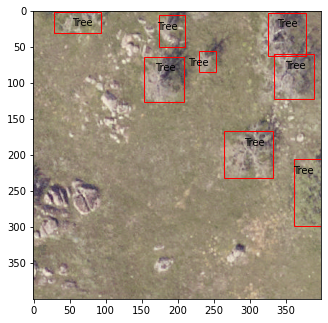

In [ ]:
#@title SAMPLE PLOT - shape (480, 640, 3)
fig = plt.figure()
import cv2
#add axes to the image
ax = fig.add_axes([0,0,1,1])

# read and plot the image
image = plt.imread('/content/NeonTreeEvaluation/evaluation/RGB/2018_SJER_3_252000_4104000_image_628.tif')
plt.imshow(image)

# iterating over the image for different objects
for _,row in df[df['prev_filename'] == "2018_SJER_3_252000_4104000_image_628.tif"].iterrows():
  xmin = row.xmin
  xmax = row.xmax
  ymin = row.ymin
  ymax = row.ymax

  width = xmax - xmin
  height = ymax - ymin
  
  # assign different color to different classes of objects
  if row.cell_type == 'Tree':
      edgecolor = 'r'
      ax.annotate('Tree', xy=(xmax-40,ymin+20))
      
  # add bounding boxes to the image
  rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')
  
  ax.add_patch(rect)

In [ ]:
df_train, df_valid = model_selection.train_test_split(df, test_size=0.1, random_state=13, shuffle=True)
print(df_train.shape, df_valid.shape)

(5695, 16) (633, 16)


In [ ]:
try:
  os.mkdir('/content/nte/')
  os.mkdir('/content/nte/images/')
  os.mkdir('/content/nte/images/train/')
  os.mkdir('/content/nte/images/valid/')

  os.mkdir('/content/nte/labels/')
  os.mkdir('/content/nte/labels/train/')
  os.mkdir('/content/nte/labels/valid/')
except:
  print('directories already exists')

In [ ]:
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    txt_filename = os.path.join(train_label_path,str(row.prev_filename.split('.')[0])+".txt")
    # Save the .img & .txt files to the corresponding train and validation folders
    try:
      shutil.copyfile(os.path.join(img_path,row.prev_filename), os.path.join(train_img_path,row.prev_filename))
      np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    except FileNotFoundError:
      print('The file ' + os.path.join(img_path,row.prev_filename) + ' was no found, continuing with the next.')

In [ ]:
%%time
src_img_path = "/content/NeonTreeEvaluation/evaluation/RGB/"
src_label_path = "/content/NeonTreeEvaluation/annotations/"

train_img_path = "/content/nte/images/train"
train_label_path = "/content/nte/labels/train"

valid_img_path = "/content/nte/images/valid"
valid_label_path = "/content/nte/labels/valid"

segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_valid, src_img_path, src_label_path, valid_img_path, valid_label_path)

The file /content/NeonTreeEvaluation/evaluation/RGB/2018_SJER_3_252000_4113000_image_310.tif was no found, continuing with the next.
The file /content/NeonTreeEvaluation/evaluation/RGB/2018_SJER_3_253000_4108000_image_721.tif was no found, continuing with the next.
The file /content/NeonTreeEvaluation/evaluation/RGB/2018_SJER_3_253000_4108000_image_721.tif was no found, continuing with the next.
CPU times: user 2.3 s, sys: 466 ms, total: 2.76 s
Wall time: 5.09 s


In [ ]:
try:
  shutil.rmtree('/content/nte/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/nte/images/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/nte/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/nte/labels/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("No. of Training images", len(os.listdir('/content/nte/images/train')))
print("No. of Training labels", len(os.listdir('/content/nte/labels/train')))

print("No. of valid images", len(os.listdir('/content/nte/images/valid')))
print("No. of valid labels", len(os.listdir('/content/nte/labels/valid')))

No. of Training images 171
No. of Training labels 171
No. of valid images 129
No. of valid labels 129


In [ ]:
!echo -e 'train: /content/nte/images/train\nval: /content/nte/images/valid\n\nnc: 1\nnames: ['Tree']' >> nte.yaml
!cat 'nte.yaml'

train: /content/nte/images/train
val: /content/nte/images/valid

nc: 1
names: [Tree]


In [ ]:
shutil.copyfile('/content/nte.yaml', '/content/yolov5/nte.yaml')

'/content/yolov5/nte.yaml'

In [ ]:
!sed -i 's/nc: 80/nc: 1/g' ./models/yolov5s.yaml

sed: can't read ./models/yolov5s.yaml: No such file or directory


In [ ]:
%%time

!python yolov5/train.py --img 400 --batch 8 --epochs 500 --data nte.yaml --cfg /content/yolov5/models/yolov5s.yaml --name NTE

train: weights=yolov5/yolov5s.pt, cfg=/content/yolov5/models/yolov5s.yaml, data=nte.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=8, imgsz=400, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=NTE, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.2+cu102 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=

In [ ]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/NTE

<IPython.core.display.Javascript object>

In [ ]:
!python yolov5/detect.py --source /content/nte/images/valid/ --weights '/content/yolov5/runs/train/NTE/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/NTE/weights/best.pt'], source=/content/nte/images/valid/, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.2+cu102 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/129 /content/nte/images/valid/2018_SJER_3_252000_4104000_image_628.tif: 640x640 5 Trees, Done. (0.021s)
image 2/129 /content/nte/images/valid/2018_SJER_3_252000_4108000_image_517.tif: 640x640 6 Trees, Done. (0.021s)
image 3/129 /content/nte/images/valid/2018_SJER_3_252000_4112000_image_451.tif: 640x640 10 Trees, Done. (0.021s)


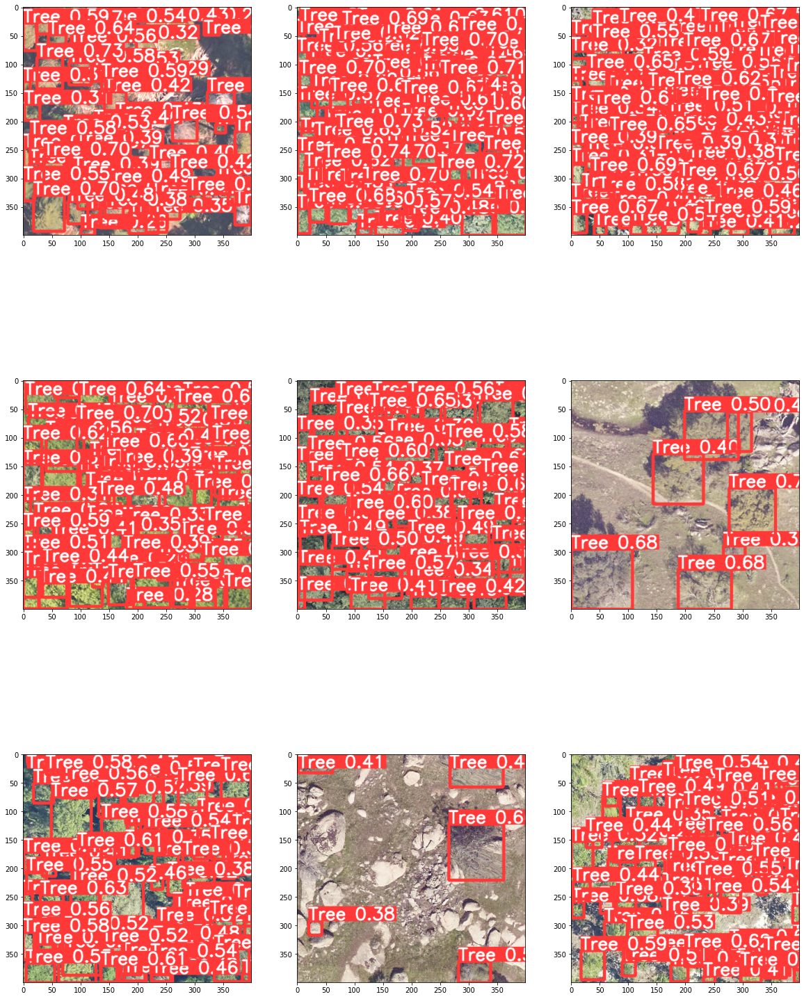

In [ ]:
disp_images = glob('/content/yolov5/runs/detect/exp/*')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 3
for i in range(1, columns*rows +1):
    img = np.random.choice(disp_images)
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()